In [1]:
versioninfo()

Julia Version 1.10.4
Commit 48d4fd48430 (2024-06-04 10:41 UTC)
Build Info:
  Official https://julialang.org/ release
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 128 × AMD EPYC 7763 64-Core Processor
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-15.0.7 (ORCJIT, znver3)
Threads: 16 default, 0 interactive, 8 GC (on 128 virtual cores)
Environment:
  LD_LIBRARY_PATH = /global/common/software/nersc/julia_hpc_24/adios2/gnu/lib64:/global/common/software/nersc9/darshan/default/lib:/opt/nvidia/hpc_sdk/Linux_x86_64/24.5/math_libs/12.4/lib64:/opt/nvidia/hpc_sdk/Linux_x86_64/24.5/cuda/12.4/extras/CUPTI/lib64:/opt/nvidia/hpc_sdk/Linux_x86_64/24.5/cuda/12.4/extras/Debugger/lib64:/opt/nvidia/hpc_sdk/Linux_x86_64/24.5/cuda/12.4/nvvm/lib64:/opt/nvidia/hpc_sdk/Linux_x86_64/24.5/cuda/12.4/lib64:/opt/cray/pe/papi/7.1.0.2/lib64:/opt/cray/libfabric/1.20.1/lib64:/opt/cray/libfabric/default/lib64
  JULIA_DEPOT_PATH = /pscratch/sd/b/blaschke/depot
  JULIA_LOAD_PATH = :/global/common/software/ners

In [2]:
using Plots

In [3]:
#energy(x; k=1, x0=0) = @. 0.5*k*(x-x0)^2
#force(x; k=1, x0=0) = @. -k*(x-x0)

energy(x; a=2, k=1, _whatever...) = @. 0.25*k*((x-a)^2) * ((x+a)^2)
force(x; a=2, k=1, _whatever...) = @. -k*x*(x-a)*(x+a)

force (generic function with 1 method)

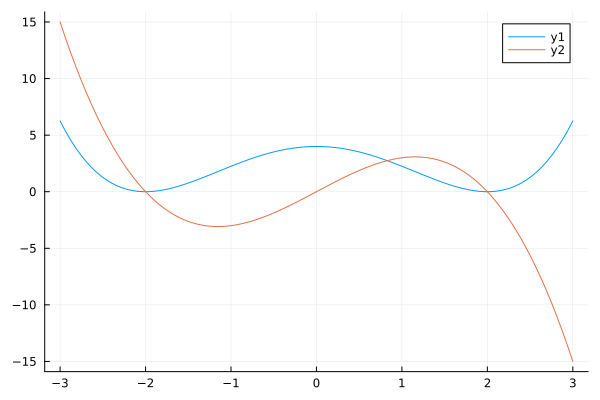

In [4]:
x = range(-3, 3, 100)
e = energy(x)
f = force(x)
plot(x, e, )
plot!(x, f)

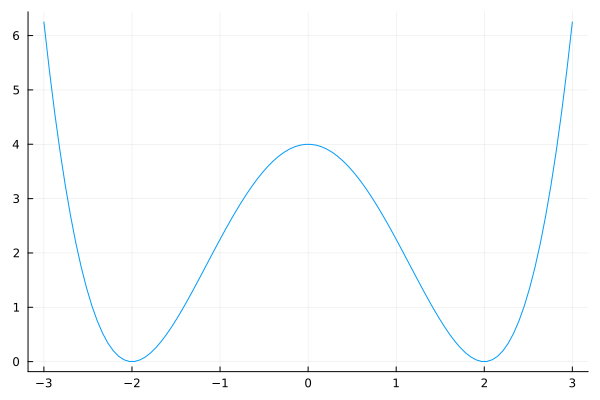

In [5]:
x = range(-3, 3, 100)
e = energy(x)
plot(x, e, legend=false)

In [9]:
using Random, Distributions

In [10]:
Random.seed!(123)

TaskLocalRNG()

In [11]:
#this is step A
position_update(x, v, dt) = @. x + v*dt/2.

#this is step B
velocity_update(v,F,dt) = @. v + F*dt/2.

function random_velocity_update(
        v::AbstractVector, gamma::Number, kBT::Number, dt::Number;
        d=Normal(0, 1)
    )
    R = rand(d, length(v))
    c1 = @. exp(-gamma*dt)
    c2 = @. sqrt(1-c1*c1)*sqrt(kBT)
    v_new = @. c1*v + R*c2
    return v_new
end

random_velocity_update(
    v::Number, gamma::Number, kBT::Number, dt::Number; d=Normal(0, 1)
) = only(random_velocity_update([v], gamma, kBT, dt; d))

random_velocity_update (generic function with 2 methods)

In [12]:
function baoab(
        energy::Function, force::Function, max_time, dt,
        gamma, kBT, initial_position::T, initial_velocity::T;
        save_frequency=3, kwargs...
    ) where T <: Number
    
    x = initial_position
    v = initial_velocity
    t = 0
    step_number = 0
    positions = T[]
    velocities = T[]
    total_energies = T[]
    save_times = T[]
    
    while t < max_time
        # B
        potential_force = force(x; kwargs...)
        v = velocity_update(v, potential_force, dt)
        # A
        x = position_update(x, v, dt)
        # O
        v = random_velocity_update(v, gamma, kBT, dt)
        # A
        x = position_update(x, v, dt)
        # B
        potential_force = force(x; kwargs...)
        v = velocity_update(v, potential_force, dt)
        
        potential_energy = energy(x; kwargs...)
        if step_number%save_frequency == 0 && step_number>0
            e_total = @. .5*v*v + potential_energy

            push!(positions, x)
            push!(velocities, v)
            push!(total_energies, e_total)
            push!(save_times, t)
        end
        
        t = @. t+dt
        step_number = @. step_number + 1
    end
    
    return save_times, positions, velocities, total_energies
end

baoab (generic function with 1 method)

In [13]:
my_k = 2
my_max_time = 100
initial_position = .1
initial_velocity = .5

my_gamma=0.5
my_kBT=3.0
my_dt=0.01

times, positions, velocities, total_energies = baoab(
    energy, force, my_max_time, my_dt, 
    my_gamma, my_kBT,
    initial_position, initial_velocity;
    k=my_k
);

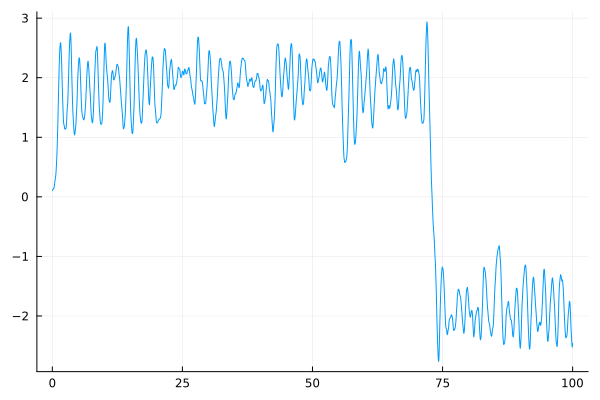

In [14]:
plot(times, positions, label="")

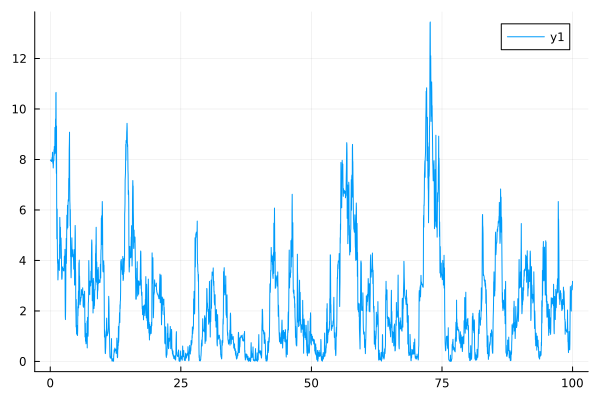

In [15]:
plot(times, total_energies)

In [18]:
open("pv.csv","a") do io 
    for (p, v) in zip(positions, velocities)
        println(io, "$(p), $(v)")
    end
end

In [12]:
function local_ensemble(
        energy::Function, force::Function, max_time, dt,
        gamma, kBT, t, p::T, v::T;
        ensemble=(len=10, d=Normal(0, 0.01), n=10, st=10),
        kwargs...
    ) where T <: Number
    
    ensemble_t = Array{T, 1}[]
    ensemble_p = Array{T, 1}[]
    ensemble_v = Array{T, 1}[]

    p_r = rand(ensemble.d, ensemble.n)
    v_r = rand(ensemble.d, ensemble.n)

    for i in 1:ensemble.n
        t_i, p_i, v_i, _ = baoab(
            energy, force, ensemble.len*dt, dt,
            gamma, kBT, p + p_r[i], v + v_r[i];
            kwargs...
        )
        push!(ensemble_t, t .+ t_i)
        push!(ensemble_p, p_i)
        push!(ensemble_v, v_i)
    end
    
    return ensemble_t, ensemble_p, ensemble_v
end

local_ensemble (generic function with 1 method)

In [13]:
function baoab_ensemble(
        energy::Function, force::Function, max_time, dt,
        gamma, kBT, initial_position::T, initial_velocity::T;
        ensemble=(len=10, d=Normal(0, 0.01), n=10, st=10), kwargs...
    ) where T <: Number
    
    times, positions, velocities, total_energies = baoab(
        energy, force, max_time, dt,
        gamma, kBT, initial_position, initial_velocity;
        kwargs...
    )
    
    ensemble_t = Array{T, 1}[]
    ensemble_p = Array{T, 1}[]
    ensemble_v = Array{T, 1}[]
    for (t, p, v) in zip(
            times[1:ensemble.st:end],
            positions[1:ensemble.st:end],
            velocities[1:ensemble.st:end]
        )
        t_e, p_e, v_e = local_ensemble(
            energy, force, ensemble.len*dt, dt,
            gamma, kBT, t, p, v;
            ensemble=ensemble, kwargs...
        )
        for (t_i, p_i, v_i) in zip(t_e, p_e, v_e)
            push!(ensemble_t, t_i)
            push!(ensemble_p, p_i)
            push!(ensemble_v, v_i)
        end
    end

    return times, positions, velocities, total_energies, (t=ensemble_t, p=ensemble_p, v=ensemble_v)
end

baoab_ensemble (generic function with 1 method)

In [14]:
times, positions, velocities, total_energies, ensemble = baoab_ensemble(
    energy, force, my_max_time/4, my_dt, 
    my_gamma, my_kBT,
    initial_position, initial_velocity;
    k=my_k, ensemble=(len=80, d=Normal(0, 0.001), n=100, st=1)
);

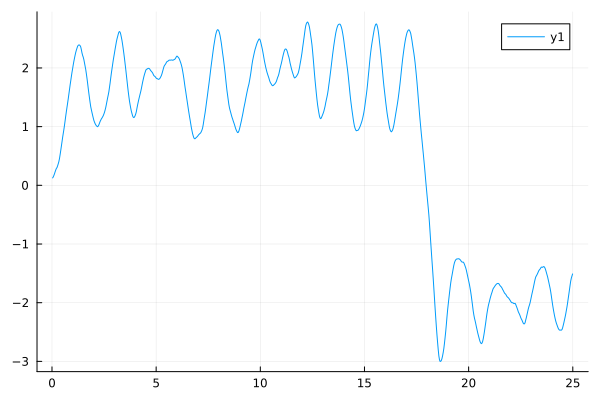

In [15]:
plot(times, positions)

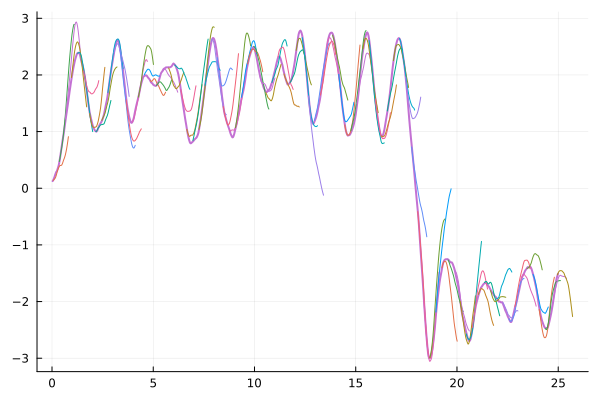

In [16]:
plot(times, positions; linewidth=2, c=4, legend=false)
for (t, p) in zip(
        ensemble.t[1:1000:end],
        ensemble.p[1:1000:end]
    )
    plot!(t, p)
end
plot!()

In [52]:
ensemble.t[1][end]

0.8100000000000005

In [17]:
ensemble_set_p = Dict{Float64}{Set{Float64}}()
ensemble_range_p = Dict{Float64}{Tuple{Float64, Float64, Float64}}()

for i in 1:length(ensemble.t)
    k = ensemble.t[i][end]
    s = get!(ensemble_set_p, k, Set{Float64}())
    push!(s, ensemble.p[i][end])
end

for k in keys(ensemble_set_p)
    s = ensemble_set_p[k]
    ensemble_range_p[k] = (minimum(s), maximum(s), var(s))
end

ensemble_t   = sort(collect(keys(ensemble_range_p)))
ensemble_lo  = [ensemble_range_p[t][1] for t in ensemble_t]
ensemble_hi  = [ensemble_range_p[t][2] for t in ensemble_t]
ensemble_var = [ensemble_range_p[t][3] for t in ensemble_t]

delta_t = ensemble_t[1] - times[1]

0.7800000000000005

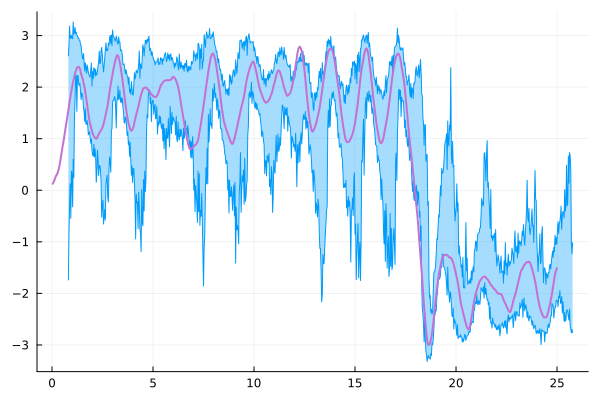

In [18]:
plot(ensemble_t, ensemble_hi, c = 1)
plot!(ensemble_t, ensemble_lo, fillrange = ensemble_hi, fillalpha = 0.35, c = 1)
plot!(times, positions; linewidth=2, c=4, legend=false)

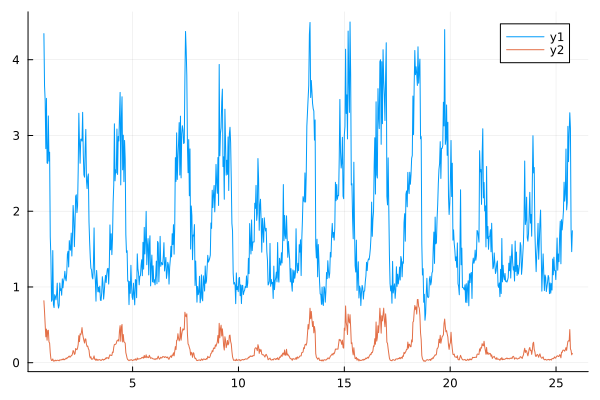

In [19]:
plot(ensemble_t, ensemble_hi-ensemble_lo, c = 1)
plot!(ensemble_t, ensemble_var, c = 2)

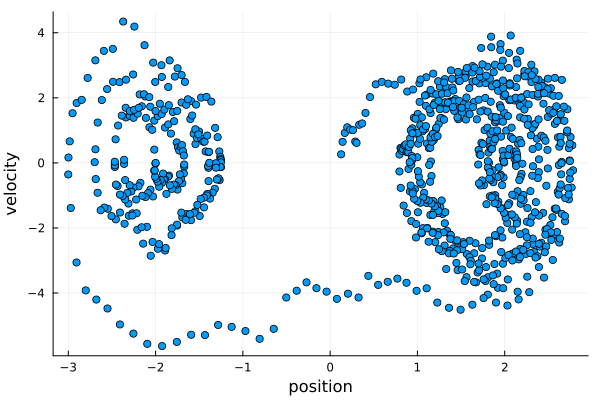

In [20]:
scatter(positions, velocities, markershape=:circ, label="")
xlabel!("position")
ylabel!("velocity")

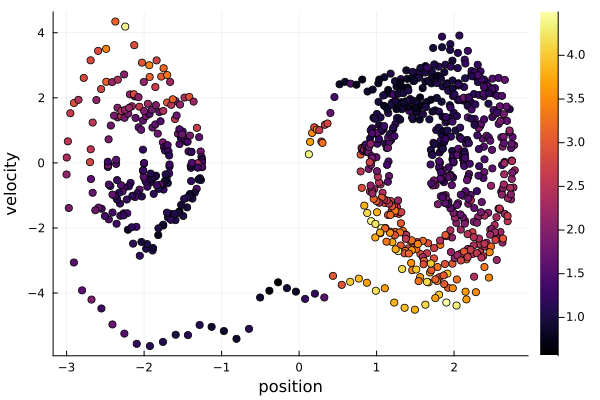

In [21]:
scatter(positions, velocities, markershape=:circ, zcolor=ensemble_hi-ensemble_lo, label="")
xlabel!("position")
ylabel!("velocity")

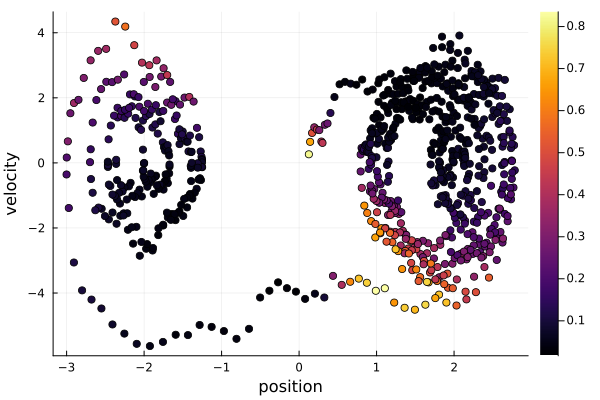

In [22]:
scatter(positions, velocities, markershape=:circ, zcolor=ensemble_var, label="")
xlabel!("position")
ylabel!("velocity")

In [23]:
using Flux, CUDA, cuDNN, Statistics, ProgressMeter

In [24]:
CUDA.allowscalar(false)

In [25]:
CUDA.versioninfo()

CUDA runtime 12.2, local installation
CUDA driver 12.3
NVIDIA driver 525.105.17, originally for CUDA 12.2

CUDA libraries: 
- CUBLAS: 12.2.1
- CURAND: 10.3.3
- CUFFT: 11.0.8
- CUSOLVER: 11.5.0
- CUSPARSE: 12.1.1
- CUPTI: 20.0.0
- NVML: 12.0.0+525.105.17

Julia packages: 
- CUDA: 5.1.2
- CUDA_Driver_jll: 0.7.0+1
- CUDA_Runtime_jll: 0.10.1+0
- CUDA_Runtime_Discovery: 0.2.4

Toolchain:
- Julia: 1.9.4
- LLVM: 14.0.6

Preferences:
- CUDA_Runtime_jll.version: 12.2
- CUDA_Runtime_jll.local: true

1 device:
  0: NVIDIA A100-PCIE-40GB (sm_80, 38.985 GiB / 40.000 GiB available)


In [26]:
# Phase-space coordinate
pcoord = hcat(positions, velocities) |> transpose
# Phase-space class
lrate = ensemble_hi - ensemble_lo  # Lyapunov rate
pclass = Array{Int16, 1}(undef, size(lrate)...)
fill!(pclass, 0)
pclass[lrate .> 2] .= 1
pclass[lrate .> 3] .= 2;

In [27]:
N_coord = 2
N_class = 3
N_neuron = 8

model = Chain(
    Dense(N_coord => N_neuron, tanh),
    BatchNorm(N_neuron),
    Dense(N_neuron => N_class),
    softmax
) |> gpu        # move model to GPU, if available

Chain(
  Dense(2 => 8, tanh),                  # 24 parameters
  BatchNorm(8),                         # 16 parameters, plus 16
  Dense(8 => 3),                        # 27 parameters
  NNlib.softmax,
)         # Total: 6 trainable arrays, 67 parameters,
          # plus 2 non-trainable, 16 parameters, summarysize 1.258 KiB.

In [28]:
# The model encapsulates parameters, randomly initialised. Its initial output is:
out1 = model(pcoord |> gpu) |> cpu     # 2×N Matrix{Float32}

3×833 Matrix{Float32}:
 0.391461  0.442759  0.472949  0.489664  …  0.33472   0.27816   0.258646
 0.331132  0.33517   0.335191  0.334219     0.421144  0.437332  0.439996
 0.277407  0.222071  0.191861  0.176117     0.244136  0.284508  0.301359

In [29]:
# To train the model, we use batches of 128 samples, and one-hot encoding:
target = Flux.onehotbatch(pclass, [0, 1, 2])                   # 2×N OneHotMatrix
loader = Flux.DataLoader((pcoord, target) |> gpu, batchsize=256, shuffle=true);

In [30]:
optim = Flux.setup(Flux.Adam(1e-2), model)  # will store optimiser momentum, etc.

# @showprogress for epoch in 1:1_00
#     Flux.train!(model, loader, optim) do m, x, y
#         y_hat = m(x)
#         Flux.crossentropy(y_hat, y)
#     end
# end

losses = []
@showprogress for epoch in 1:1_000
    CUDA.@allowscalar for (x, y) in loader
        loss, grads = Flux.withgradient(model) do m
            # Evaluate model and loss inside gradient context:
            y_hat = m(x)
            Flux.crossentropy(y_hat, y)
        end
        Flux.update!(optim, model, grads[1])
        push!(losses, loss)  # logging, outside gradient context
    end
end

Progress: 100%|█████████████████████████████████████████| Time: 0:01:15


In [31]:
out2 = model(pcoord |> gpu) |> cpu

3×833 Matrix{Float32}:
 7.20176f-6  4.80488f-5  0.000425607  …  0.508669   0.868938    0.910906
 0.0981977   0.182905    0.345574        0.477543   0.129637    0.0883059
 0.901795    0.817047    0.654001        0.0137878  0.00142416  0.000787919

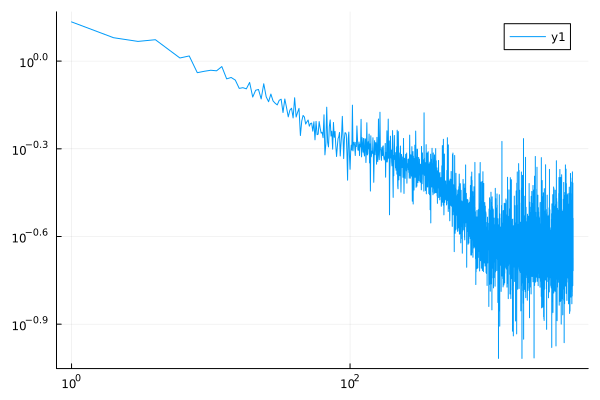

In [32]:
plot(losses, xaxis=:log, yaxis=:log)

In [33]:
function classify(coords)
    prob_class = model(coords |> gpu) |> cpu 
    return map(x->x[1], argmax(prob_class, dims=1))[:];
end

classify (generic function with 1 method)

In [34]:
rand_coord = 6 .* rand(Float32, 2, 10_000) .- 3

2×10000 Matrix{Float32}:
 2.94663  -0.734533   1.65337  -0.297453  …  -1.05016   0.634385  -0.391406
 2.7637    2.10487   -1.64691   0.958661      1.8784   -2.12742    0.672416

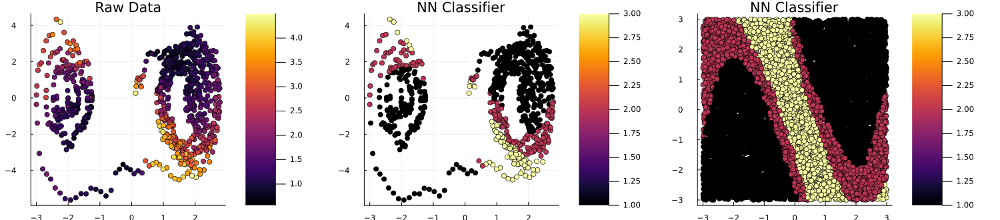

In [35]:
p_true = scatter(pcoord[1, :],     pcoord[2,:],      zcolor=lrate,                title="Raw Data")
p_nn   = scatter(pcoord[1, :],     pcoord[2,:],      zcolor=classify(pcoord),     title="NN Classifier")
p_rand = scatter(rand_coord[1, :], rand_coord[2, :], zcolor=classify(rand_coord), title="NN Classifier")

plot(p_true, p_nn, p_rand, layout=(1,3), size=(1500,330), legend=false)

In [37]:
# Phase-space coordinate
pcoord = hcat(positions, velocities) |> transpose
# Phase-space class
lrate = ensemble_var  # Lyapunov rate
pclass = Array{Int16, 1}(undef, size(lrate)...)
fill!(pclass, 0)
pclass[lrate .> 0.1] .= 1
pclass[lrate .> 0.5] .= 2;

In [38]:
N_coord = 2
N_class = 3
N_neuron = 8

model = Chain(
    Dense(N_coord => N_neuron, tanh),
    BatchNorm(N_neuron),
    Dense(N_neuron => N_class),
    softmax
) |> gpu        # move model to GPU, if available

Chain(
  Dense(2 => 8, tanh),                  # 24 parameters
  BatchNorm(8),                         # 16 parameters, plus 16
  Dense(8 => 3),                        # 27 parameters
  NNlib.softmax,
)         # Total: 6 trainable arrays, 67 parameters,
          # plus 2 non-trainable, 16 parameters, summarysize 1.258 KiB.

In [39]:
# The model encapsulates parameters, randomly initialised. Its initial output is:
out1 = model(pcoord |> gpu) |> cpu     # 2×N Matrix{Float32}

3×833 Matrix{Float32}:
 0.317135  0.322463  0.318339  0.311569  …  0.633011  0.635013  0.632266
 0.305528  0.250754  0.219768  0.203822     0.12581   0.133168  0.137279
 0.377337  0.426783  0.461893  0.484609     0.241179  0.231819  0.230454

In [40]:
# To train the model, we use batches of 128 samples, and one-hot encoding:
target = Flux.onehotbatch(pclass, [0, 1, 2])                   # 2×N OneHotMatrix
loader = Flux.DataLoader((pcoord, target) |> gpu, batchsize=128, shuffle=true);

In [41]:
optim = Flux.setup(Flux.Adam(1e-2), model)  # will store optimiser momentum, etc.

# @showprogress for epoch in 1:1_00
#     Flux.train!(model, loader, optim) do m, x, y
#         y_hat = m(x)
#         Flux.crossentropy(y_hat, y)
#     end
# end

losses = []
@showprogress for epoch in 1:1_000
    CUDA.@allowscalar for (x, y) in loader
        loss, grads = Flux.withgradient(model) do m
            # Evaluate model and loss inside gradient context:
            y_hat = m(x)
            Flux.crossentropy(y_hat, y)
        end
        CUDA.@allowscalar Flux.update!(optim, model, grads[1])
        push!(losses, loss)  # logging, outside gradient context
    end
end

Progress: 100%|█████████████████████████████████████████| Time: 0:00:48


In [42]:
out2 = model(pcoord |> gpu) |> cpu

3×833 Matrix{Float32}:
 1.66835f-5  0.000132127  0.000777659  0.00285663  …  0.149228     0.28009
 0.227399    0.4804       0.719717     0.852008       0.850772     0.71991
 0.772584    0.519468     0.279506     0.145135       3.09338f-12  1.7305f-12

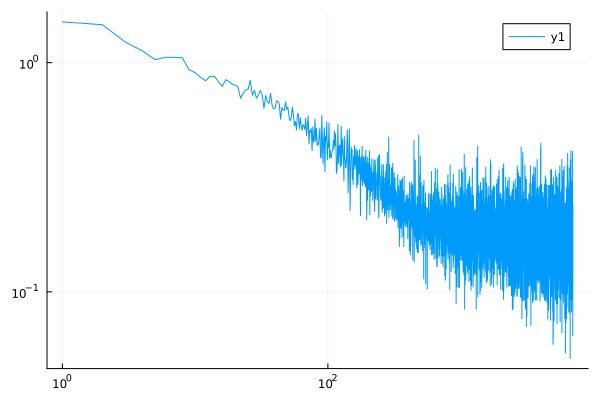

In [43]:
plot(losses, xaxis=:log, yaxis=:log)

In [44]:
function classify(coords)
    prob_class = model(coords |> gpu) |> cpu 
    return map(x->x[1], argmax(prob_class, dims=1))[:];
end

classify (generic function with 1 method)

In [45]:
rand_coord = 8 .* rand(Float32, 2, 10_000) .- 4

2×10000 Matrix{Float32}:
  2.25869  1.16887  -3.28555  -3.20006   …  -1.15843   0.266382   1.03158
 -1.81518  1.40937   3.33665  -0.120558      0.951588  2.45698   -3.99607

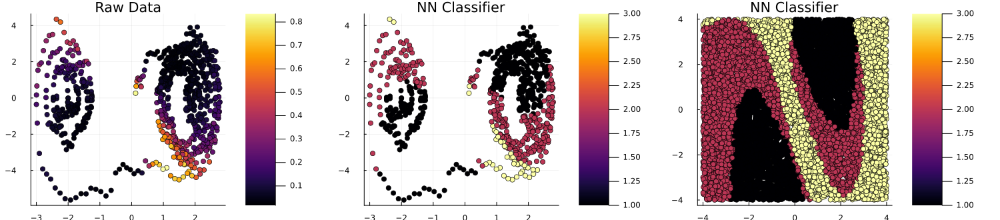

In [46]:
p_true = scatter(pcoord[1, :],     pcoord[2,:],      zcolor=lrate,                title="Raw Data")
p_nn   = scatter(pcoord[1, :],     pcoord[2,:],      zcolor=classify(pcoord),     title="NN Classifier")
p_rand = scatter(rand_coord[1, :], rand_coord[2, :], zcolor=classify(rand_coord), title="NN Classifier")

plot(p_true, p_nn, p_rand, layout=(1,3), size=(1500,330), legend=false)

In [47]:
N_coord = 2
N_class = 3
N_neuron = 8

model = Chain(
    Dense(N_coord => N_neuron, tanh),
    BatchNorm(N_neuron),
    Dense(N_neuron => N_class),
    softmax
) |> gpu        # move model to GPU, if available

Chain(
  Dense(2 => 8, tanh),                  # 24 parameters
  BatchNorm(8),                         # 16 parameters, plus 16
  Dense(8 => 3),                        # 27 parameters
  NNlib.softmax,
)         # Total: 6 trainable arrays, 67 parameters,
          # plus 2 non-trainable, 16 parameters, summarysize 1.258 KiB.

In [48]:
positions = Float64[]
velocities = Float64[]

Float64[]

In [60]:
ensemble = (len=80, d=Normal(0, 0.001), n=100, st=1)
t_e, p_e, v_e = local_ensemble(
    energy, force, ensemble.len*my_dt, my_dt,
    my_gamma, my_kBT, 0., 0., 0.;
    ensemble=ensemble
)
var(map(x->x[end], p_e))

0.5247988114689737

In [ ]:
# Phase-space coordinate
pcoord = hcat(positions, velocities) |> transpose
# Phase-space class
lrate = ensemble_var  # Lyapunov rate
pclass = Array{Int16, 1}(undef, size(lrate)...)
fill!(pclass, 0)
pclass[lrate .> 0.1] .= 1
pclass[lrate .> 0.5] .= 2;